In [1]:
# Most items in this notebook are defined in metadata.py around line 505
import os
import sys
import numpy as np

sys.path.append(os.path.join(os.environ['REPO_DIR'], 'utilities'))
from utilities2015 import *
from metadata import *
from data_manager import *

import matplotlib.pyplot as plt
%matplotlib inline

ENABLE_UPLOAD_S3 is not set, default to False.
ENABLE_DOWNLOAD_S3 is not set, default to False.


Setting environment for an unknown machine. Global root paths must be set as env variables.
{'MD589': 0.46}
Loaded data from saved metadata_cache for MD589


No vtk
No mcubes
Folder for stack MD585 not found, skipping.
Folder for stack MD590 not found, skipping.
Folder for stack MD591 not found, skipping.
Folder for stack MD592 not found, skipping.
Folder for stack MD593 not found, skipping.
Folder for stack MD594 not found, skipping.
Folder for stack MD595 not found, skipping.
Folder for stack MD598 not found, skipping.
Folder for stack MD599 not found, skipping.
Folder for stack MD602 not found, skipping.
Folder for stack MD603 not found, skipping.
Folder for stack MD635 not found, skipping.
Folder for stack MD653 not found, skipping.
Folder for stack MD652 not found, skipping.
Folder for stack MD642 not found, skipping.
Folder for stack MD657 not found, skipping.
Folder for stack MD658 not found, skipping.
Folder for stack MD661 not found, skipping.
Folder for stack MD662 not found, skipping.
Folder for stack CHATM2 not found, skipping.
Folder for stack CHATM3 not found, skipping.
Folder for stack UCSD001 not found, skipping.


# Window and Classifier Settings

In [2]:
! aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_metadata_cache.json \
    $ROOT_DIR/CSHL_data_processed/MD589/

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_metadata_cache.json to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_metadata_cache.json


In [5]:
# stack= 'MD589'
# if not os.path.exists(os.environ['ROOT_DIR']+'CSHL_data_processed/'+stack+'/'):
#     sys.stderr.write("Folder for stack %s not found, skipping.\n" % (stack))
# # Try to load metadata_cache.json file before doing anything else
# try:
#     with open(os.environ['ROOT_DIR']+'CSHL_data_processed/'+stack+'/'+stack+'_metadata_cache.json') as json_file:  
#         saved_metadata = json.load(json_file)
#     for key in saved_metadata.keys():
#         # The metadata_cache json file has extraneous keys. (currently only "stack")
# #         if key=='stack':
# #             continue
#         if key=='sections_to_filenames':
#             metadata_cache[key][stack] = {int(k):v for k,v in saved_metadata[key].items()}
#         else:
#             metadata_cache[key][stack] = saved_metadata[key]
#     print( 'Loaded data from saved metadata_cache for '+stack )
#     #continue
# except:
#     A

In [2]:
metadata_cache['section_limits']

{u'MD589': [92, 370]}

In [2]:
windowing_settings

{1: {'patch_size': 224, 'spacing': 56},
 2: {'comment': 'larger margin', 'patch_size': 224, 'spacing': 56},
 3: {'comment': 'smaller spacing', 'patch_size': 224, 'spacing': 32},
 4: {'comment': 'smaller spacing', 'patch_size': 224, 'spacing': 128},
 5: {'comment': 'smaller spacing', 'patch_size': 224, 'spacing': 64},
 6: {'comment': 'twice as large patch', 'patch_size': 448, 'spacing': 64},
 7: {'comment': 'specify size/spacing in terms of microns rather than pixels',
  'patch_size_um': 103.04,
  'spacing_um': 30},
 8: {'comment': 'larger patch', 'patch_size_um': 206.08, 'spacing_um': 30},
 9: {'comment': 'larger patch', 'patch_size_um': 412.16, 'spacing_um': 30},
 10: {'comment': 'larger patch', 'patch_size_um': 824.32, 'spacing_um': 30},
 11: {'comment': 'larger patch', 'patch_size_um': 51.52, 'spacing_um': 30},
 12: {'comment': 'larger patch', 'patch_size_um': 25.76, 'spacing_um': 30}}

In [3]:
classifier_settings

,model,margin_um,train_set_id,neg_composition,sample_weighting,input_img_version,svm_id,comment,num_samples_per_class
classifier_id,,,,,,,,,
30,lr,500,20/21,neg_has_all_surround,NaN,cropped_gray,30.0,NaN,NaN
31,lr,500,21/22,neg_has_all_surround,NaN,cropped_gray,31.0,NaN,NaN
32,lr,500,20/22,neg_has_all_surround,NaN,cropped_gray,32.0,NaN,NaN
33,gb1,500,20/21,neg_has_all_surround,NaN,cropped_gray,33.0,NaN,NaN
34,gb1,500,21/22,neg_has_all_surround,NaN,cropped_gray,34.0,NaN,NaN
35,gb1,500,20/22,neg_has_all_surround,NaN,cropped_gray,35.0,NaN,NaN
36,gb1,500,23/24,neg_has_all_surround,NaN,cropped_gray,36.0,NaN,NaN
37,lr,500,23/24,neg_has_all_surround,NaN,cropped_gray,37.0,NaN,NaN
38,lr,500,23/24/27/28,neg_has_surround_and_negative,NaN,cropped_gray,38.0,NaN,NaN


# Patch Locations

In [5]:
! ls $ROOT_DIR/CSHL_labelings_v3/MD589/

MD589_annotation_contours_05312018031718.hdf
MD589_annotation_win1_05312018031718_grid_indices_lookup.hdf
MD589_annotation_win7_05312018031718_grid_indices_lookup.hdf
MD589_annotation_win8_05312018031718_grid_indices_lookup.hdf


In [6]:
! aws s3 cp --recursive s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/ \
    $ROOT_DIR/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC16-2015.07.30-22.20.07_MD589_3_0048_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC16-2015.07.30-22.20.07_MD589_3_0048_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC17-2015.07.30-22.23.59_MD589_3_0051_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC17-2015.07.30-22.23.59_MD589_3_0051_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC17-2015.07.30-22.23.59_MD589_2_0050_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC17-2015.07.30-22.23.59_MD589_2_0050_prep2_gray_win1_patchLocations

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC24-2015.07.30-22.52.55_MD589_2_0071_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC24-2015.07.30-22.52.55_MD589_2_0071_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC27-2015.07.30-23.06.26_MD589_1_0079_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC27-2015.07.30-23.06.26_MD589_1_0079_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC24-2015.07.30-22.52.55_MD589_3_0072_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC24-2015.07.30-22.52.55_MD589_3_0072_prep2_gray_win1_patchLocations

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC38-2015.07.30-23.54.24_MD589_1_0112_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC38-2015.07.30-23.54.24_MD589_1_0112_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC39-2015.07.30-23.58.27_MD589_1_0115_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC39-2015.07.30-23.58.27_MD589_1_0115_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC35-2015.07.30-23.42.32_MD589_2_0104_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC35-2015.07.30-23.42.32_MD589_2_0104_prep2_gray_win1_patchLocations

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC44-2015.07.31-00.18.50_MD589_2_0131_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC44-2015.07.31-00.18.50_MD589_2_0131_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC50-2015.07.31-00.43.12_MD589_2_0149_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC50-2015.07.31-00.43.12_MD589_2_0149_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC51-2015.07.31-00.47.11_MD589_3_0153_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC51-2015.07.31-00.47.11_MD589_3_0153_prep2_gray_win1_patchLocations

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC56-2015.07.31-01.13.31_MD589_3_0168_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC56-2015.07.31-01.13.31_MD589_3_0168_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC59-2015.07.31-01.26.55_MD589_3_0177_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC59-2015.07.31-01.26.55_MD589_3_0177_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC57-2015.07.31-01.18.16_MD589_3_0171_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC57-2015.07.31-01.18.16_MD589_3_0171_prep2_gray_win1_patchLocations

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC64-2015.07.31-01.47.28_MD589_2_0191_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC64-2015.07.31-01.47.28_MD589_2_0191_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC63-2015.07.31-01.43.31_MD589_1_0187_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC63-2015.07.31-01.43.31_MD589_1_0187_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC68-2015.07.31-02.03.18_MD589_1_0202_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-IHC68-2015.07.31-02.03.18_MD589_1_0202_prep2_gray_win1_patchLocations

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N23-2015.07.30-17.31.29_MD589_3_0069_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N23-2015.07.30-17.31.29_MD589_3_0069_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N24-2015.07.30-17.35.51_MD589_1_0070_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N24-2015.07.30-17.35.51_MD589_1_0070_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N21-2015.07.30-17.23.23_MD589_2_0062_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N21-2015.07.30-17.23.23_MD589_2_0062_prep2_gray_win1_patchLocations.txt
downloa

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N30-2015.07.30-18.03.11_MD589_1_0088_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N30-2015.07.30-18.03.11_MD589_1_0088_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N32-2015.07.30-18.12.36_MD589_1_0094_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N32-2015.07.30-18.12.36_MD589_1_0094_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N29-2015.07.30-17.58.29_MD589_2_0086_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N29-2015.07.30-17.58.29_MD589_2_0086_prep2_gray_win1_patchLocations.txt
downloa

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N46-2015.07.30-19.08.29_MD589_1_0136_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N46-2015.07.30-19.08.29_MD589_1_0136_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N43-2015.07.30-18.56.33_MD589_1_0127_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N43-2015.07.30-18.56.33_MD589_1_0127_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N45-2015.07.30-19.04.31_MD589_2_0134_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N45-2015.07.30-19.04.31_MD589_2_0134_prep2_gray_win1_patchLocations.txt
downloa

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N53-2015.07.30-19.39.11_MD589_3_0159_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N53-2015.07.30-19.39.11_MD589_3_0159_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N56-2015.07.30-19.54.42_MD589_1_0166_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N56-2015.07.30-19.54.42_MD589_1_0166_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N54-2015.07.30-19.44.32_MD589_2_0161_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N54-2015.07.30-19.44.32_MD589_2_0161_prep2_gray_win1_patchLocations.txt
downloa

download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N65-2015.07.30-20.31.20_MD589_1_0193_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N65-2015.07.30-20.31.20_MD589_1_0193_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N65-2015.07.30-20.31.20_MD589_2_0194_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N65-2015.07.30-20.31.20_MD589_2_0194_prep2_gray_win1_patchLocations.txt
download: s3://mousebrainatlas-data/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N63-2015.07.30-20.23.12_MD589_3_0189_prep2_gray_win1_patchLocations.txt to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD589/MD589_prep2_gray_win1/MD589-N63-2015.07.30-20.23.12_MD589_3_0189_prep2_gray_win1_patchLocations.txt
downloa

In [9]:
! aws s3 cp --recursive s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/ \
    $ROOT_DIR/CSHL_data_processed/MD589/MD589_prep2_thumbnail/

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC19-2015.07.30-22.32.05_MD589_2_0056_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC19-2015.07.30-22.32.05_MD589_2_0056_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC19-2015.07.30-22.32.05_MD589_1_0055_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC19-2015.07.30-22.32.05_MD589_1_0055_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC18-2015.07.30-22.27.59_MD589_3_0054_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC18-2015.07.30-22.27.59_MD589_3_0054_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-I

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC37-2015.07.30-23.50.39_MD589_2_0110_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC37-2015.07.30-23.50.39_MD589_2_0110_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC39-2015.07.30-23.58.27_MD589_1_0115_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC39-2015.07.30-23.58.27_MD589_1_0115_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC40-2015.07.31-00.02.21_MD589_2_0119_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC40-2015.07.31-00.02.21_MD589_2_0119_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-I

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC53-2015.07.31-00.58.06_MD589_3_0159_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC53-2015.07.31-00.58.06_MD589_3_0159_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC51-2015.07.31-00.47.11_MD589_1_0151_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC51-2015.07.31-00.47.11_MD589_1_0151_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC53-2015.07.31-00.58.06_MD589_2_0158_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC53-2015.07.31-00.58.06_MD589_2_0158_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-I

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N18-2015.07.30-17.11.24_MD589_1_0052_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N18-2015.07.30-17.11.24_MD589_1_0052_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC69-2015.07.31-02.07.15_MD589_2_0206_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-IHC69-2015.07.31-02.07.15_MD589_2_0206_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N19-2015.07.30-17.15.15_MD589_1_0055_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N19-2015.07.30-17.15.15_MD589_1_0055_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N19-2015.

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N28-2015.07.30-17.53.43_MD589_1_0082_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N28-2015.07.30-17.53.43_MD589_1_0082_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N27-2015.07.30-17.49.06_MD589_2_0080_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N27-2015.07.30-17.49.06_MD589_2_0080_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N29-2015.07.30-17.58.29_MD589_2_0086_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N29-2015.07.30-17.58.29_MD589_2_0086_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N28-2015.07.3

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N39-2015.07.30-18.40.43_MD589_1_0115_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N39-2015.07.30-18.40.43_MD589_1_0115_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N40-2015.07.30-18.44.48_MD589_2_0119_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N40-2015.07.30-18.44.48_MD589_2_0119_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N42-2015.07.30-18.52.37_MD589_1_0124_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N42-2015.07.30-18.52.37_MD589_1_0124_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N38-2015.07.3

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N48-2015.07.30-19.16.21_MD589_2_0143_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N48-2015.07.30-19.16.21_MD589_2_0143_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N53-2015.07.30-19.39.11_MD589_1_0157_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N53-2015.07.30-19.39.11_MD589_1_0157_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N53-2015.07.30-19.39.11_MD589_2_0158_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N53-2015.07.30-19.39.11_MD589_2_0158_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N54-2015.07.3

download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N62-2015.07.30-20.20.08_MD589_1_0184_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N62-2015.07.30-20.20.08_MD589_1_0184_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N60-2015.07.30-20.11.20_MD589_3_0180_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N60-2015.07.30-20.11.20_MD589_3_0180_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N63-2015.07.30-20.23.12_MD589_3_0189_prep2_thumbnail.tif to ../../BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N63-2015.07.30-20.23.12_MD589_3_0189_prep2_thumbnail.tif
download: s3://mousebrainatlas-data/CSHL_data_processed/MD589/MD589_prep2_thumbnail/MD589-N64-2015.07.3

In [ ]:
# MD585
# prep2_start, prep2_end = 105, 360
# X_OFFSET_PREP2_MD585 = -952
# Y_OFFSET_PREP2_MD585 = 448

# MD589
# prep2_start, prep2_end = 92, 370

# MD594
# prep2_start, prep2_end = 92, 364

## Variables definition

In [3]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

import sys
import os
import time

sys.path.append(os.environ['REPO_DIR'] + '/utilities')
from utilities2015 import *
from metadata import *
from data_manager import *
from learning_utilities_NOMXNET import *


win_id = 1
stack = 'MD589'
# print filename_to_section['MD585-IHC34-2015.07.16-16.38.23_MD585_2_0101']


paired_structures = ['5N', '6N', '7N', '7n', 'Amb', 'LC', 'LRt', 'Pn', 'Tz', 'VLL', 'RMC', \
                     'SNC', 'SNR', '3N', '4N', 'Sp5I', 'Sp5O', 'Sp5C', 'PBG', '10N', 'VCA', 'VCP', 'DC']
singular_structures = ['AP', '12N', 'RtTg', 'SC', 'IC']

all_structures = paired_structures + singular_structures


# 1: {'patch_size': 224, 'spacing': 56}
patch_loc_root = ROOT_DIR+'/CSHL_patch_locations/'+stack+'/'+stack+'_prep2_gray_win1/'
# patch_loc_root = '/media/alexn/BstemAtlasDataBackup/ucsd_brain/CSHL_patch_locations/MD585/MD585_prep2_gray_win6/'
images_root = ROOT_DIR+'/CSHL_data_processed/'+stack+'/'+stack+'_prep2_thumbnail/'
raw_images_root = ROOT_DIR+'/CSHL_data_processed/'+stack+'/'+stack+'_prep2_lossless_gray/'

patch_fn_list = ! ls $patch_loc_root
image_fn_list = ! ls $images_root
raw_image_fn_list = ! ls $raw_images_root

filename_to_section, section_to_filename = DataManager.load_sorted_filenames( stack )



/Users/kuiqian/MouseBrainAtlas_dev/mousebrainatlas_virtualenv/lib/python2.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [71]:
alex_grid_indices_lookup_fp = '/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_labelings_v3/MD589\
/MD589_annotation_win1_05312018031718_grid_indices_lookup_ALEX.hdf'

### Identify patches based on human annotation
--script identify_patch_class_based_on_labeling_v3_human_annotations.py

In [34]:
# Load Annotations to Grid Indices
for stack in [stack]:
    grid_index_class_lookup, latest_timestamp = \
    generate_annotation_to_grid_indices_lookup_v2(stack, win_id=win_id, by_human=True, 
                                                  stack_m='atlasV7',
                                                 suffix='contours', timestamp='latest',
                                                 surround_margins=[200, 500],
                                                return_timestamp=True)
    
    # Everything past here just saved results
    grid_index_class_lookup_fp = \
    DataManager.get_annotation_to_grid_indices_lookup_filepath(stack=stack, win_id=win_id, 
                                                               by_human=True, timestamp=latest_timestamp)
    print grid_index_class_lookup_fp
# ! python identify_patch_class_based_on_labeling_v3_human_annotations.py MD589 1

ENABLE_DOWNLOAD_S3 is False. Skip downloading from S3.
ENABLE_DOWNLOAD_S3 is False. Skip downloading from S3.


latest timestamp:  05312018031718
/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_cropbox.ini


Seems you are using operation INIs to provide cropbox.
/Users/kuiqian/MouseBrainAtlas_dev/src/utilities/annotation_utilities.py:989: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  contour_df.set_value(cnt_id, 'vertices', vertices_wrt_alignedCropped_outResol)
/Users/kuiqian/MouseBrainAtlas_dev/src/utilities/annotation_utilities.py:990: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  contour_df.set_value(cnt_id, 'resolution', out_resolution)
/Users/kuiqian/MouseBrainAtlas_dev/src/utilities/annotation_utilities.py:995: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  contour_df.set_value(cnt_id, 'label_position', label_position_wrt_alignedCropped_outResol)
ENABLE_DOWNLOAD_S3 is False. Skip downloading from S3.
Computing grid indices lookup for section 92..

Computing grid indices lookup for section 126...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N22-2015.07.30-17.27.26_MD589_2_0065_prep2_thumbnail_mask.png
Computing grid indices lookup for section 127...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC22-2015.07.30-22.44.25_MD589_2_0065_prep2_thumbnail_mask.png
Computing grid indices lookup for section 128...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N22-2015.07.30-17.27.26_MD589_3_0066_prep2_thumbnail_mask.png
Computing grid indices lookup for section 129...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC22-2015.07.30-22.44.25_MD589_3_0066_prep2_thumbnail_mask.png
Computing grid indices lookup for section 130...
Trying to load /Use

Computing grid indices lookup for section 162...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N28-2015.07.30-17.53.43_MD589_2_0083_prep2_thumbnail_mask.png
Computing grid indices lookup for section 163...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC28-2015.07.30-23.11.15_MD589_2_0083_prep2_thumbnail_mask.png
Computing grid indices lookup for section 164...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N28-2015.07.30-17.53.43_MD589_3_0084_prep2_thumbnail_mask.png
Computing grid indices lookup for section 165...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC28-2015.07.30-23.11.15_MD589_3_0084_prep2_thumbnail_mask.png
Computing grid indices lookup for section 166...
Trying to load /Use

Computing grid indices lookup for section 198...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N36-2015.07.30-18.28.52_MD589_1_0106_prep2_thumbnail_mask.png
Computing grid indices lookup for section 199...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC36-2015.07.30-23.46.36_MD589_1_0106_prep2_thumbnail_mask.png
Computing grid indices lookup for section 200...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N36-2015.07.30-18.28.52_MD589_2_0107_prep2_thumbnail_mask.png
Computing grid indices lookup for section 201...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC36-2015.07.30-23.46.36_MD589_2_0107_prep2_thumbnail_mask.png
Computing grid indices lookup for section 202...
Trying to load /Use

Computing grid indices lookup for section 235...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC45-2015.07.31-00.23.02_MD589_1_0133_prep2_thumbnail_mask.png
Computing grid indices lookup for section 236...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N45-2015.07.30-19.04.31_MD589_2_0134_prep2_thumbnail_mask.png
Computing grid indices lookup for section 237...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC45-2015.07.31-00.23.02_MD589_2_0134_prep2_thumbnail_mask.png
Computing grid indices lookup for section 238...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N46-2015.07.30-19.08.29_MD589_1_0136_prep2_thumbnail_mask.png
Computing grid indices lookup for section 239...
Trying to load /Use

Computing grid indices lookup for section 271...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC53-2015.07.31-00.58.06_MD589_1_0157_prep2_thumbnail_mask.png
Computing grid indices lookup for section 272...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N53-2015.07.30-19.39.11_MD589_2_0158_prep2_thumbnail_mask.png
Computing grid indices lookup for section 273...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC53-2015.07.31-00.58.06_MD589_2_0158_prep2_thumbnail_mask.png
Computing grid indices lookup for section 274...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N53-2015.07.30-19.39.11_MD589_3_0159_prep2_thumbnail_mask.png
Computing grid indices lookup for section 275...
Trying to load /Use

Computing grid indices lookup for section 308...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N59-2015.07.30-20.07.00_MD589_2_0176_prep2_thumbnail_mask.png
Computing grid indices lookup for section 309...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC59-2015.07.31-01.26.55_MD589_2_0176_prep2_thumbnail_mask.png
Computing grid indices lookup for section 310...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N59-2015.07.30-20.07.00_MD589_3_0177_prep2_thumbnail_mask.png
Computing grid indices lookup for section 311...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC59-2015.07.31-01.26.55_MD589_3_0177_prep2_thumbnail_mask.png
Computing grid indices lookup for section 312...
Trying to load /Use

Computing grid indices lookup for section 345...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC65-2015.07.31-01.51.22_MD589_2_0194_prep2_thumbnail_mask.png
Computing grid indices lookup for section 346...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N65-2015.07.30-20.31.20_MD589_3_0195_prep2_thumbnail_mask.png
Computing grid indices lookup for section 347...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-IHC65-2015.07.31-01.51.22_MD589_3_0195_prep2_thumbnail_mask.png
Computing grid indices lookup for section 348...
Trying to load /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_data_processed/MD589/MD589_prep2_thumbnail_mask/MD589-N66-2015.07.30-20.35.16_MD589_1_0196_prep2_thumbnail_mask.png
Computing grid indices lookup for section 349...
Trying to load /Use

/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_labelings_v3/MD589/MD589_annotation_win1_05312018031718_grid_indices_lookup.hdf


In [37]:
grid_index_class_lookup_fp

'/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_labelings_v3/MD589/MD589_annotation_win1_05312018031718_grid_indices_lookup.hdf'

In [62]:
grid_index_class_lookup['12N'][210]

array([45488, 45489, 45490, 45491, 45694, 45695, 45696, 45697, 45698,
       45699, 45901, 45902, 45903, 45904, 45905, 45906, 45907, 45908,
       46108, 46109, 46110, 46111, 46112, 46113, 46114, 46115, 46116,
       46316, 46317, 46318, 46319, 46320, 46321, 46322, 46323, 46324,
       46523, 46524, 46525, 46526, 46527, 46528, 46529, 46530, 46531,
       46730, 46731, 46732, 46733, 46734, 46735, 46736, 46737, 46738,
       46739, 46938, 46939, 46940, 46941, 46942, 46943, 46944, 46945,
       46946, 47145, 47146, 47147, 47148, 47149, 47150, 47151, 47152,
       47153, 47154, 47353, 47354, 47355, 47356, 47357, 47358, 47359,
       47360, 47361, 47560, 47561, 47562, 47563, 47564, 47565, 47566,
       47567, 47568, 47569, 47768, 47769, 47770, 47771, 47772, 47773,
       47774, 47775, 47776, 47777, 47975, 47976, 47977, 47978, 47979,
       47980, 47981, 47982, 47983, 47984, 48183, 48184, 48185, 48186,
       48187, 48188, 48189, 48190, 48191, 48192, 48391, 48392, 48393,
       48394, 48395,

In [36]:
grid_index_class_lookup_fp

'/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/CSHL_labelings_v3/MD589/MD589_annotation_win1_05312018031718_grid_indices_lookup.hdf'

In [ ]:
# Load Annotations to Grid Indices
# for stack in [stack]:
#     grid_index_class_lookup, latest_timestamp = \
#     generate_annotation_to_grid_indices_lookup_v2(stack, win_id=win_id, by_human=True, 
#                                                   stack_m='atlasV7',
#                                                  suffix='contours', timestamp='latest',
#                                                  surround_margins=[200, 500],
#                                                 return_timestamp=True)
    
#     # Everything past here just saved results
#     grid_index_class_lookup_fp = \
#     DataManager.get_annotation_to_grid_indices_lookup_filepath(stack=stack, win_id=win_id, 
#                                                                by_human=True, timestamp=latest_timestamp)
#     print grid_index_class_lookup_fp
! python identify_patch_class_based_on_labeling_v3_human_annotations.py MD589 1

In [27]:
grid_index_class_lookup = load_hdf_v2(os.environ['ROOT_DIR']+\
                            'CSHL_labelings_v3/MD589/MD589_annotation_win1_05312018031718_grid_indices_lookup.hdf')
# Convert to x, y locations using 'all_locs'
all_locs = grid_parameters_to_sample_locations(win_id=win_id, stack=stack)

In [5]:
#print(grid_index_class_lookup.columns.values)
grid_index_class_lookup['IC'][275]

array([23047, 23048, 23049, ..., 30279, 30280, 30281])

In [16]:
! echo $ROOT_DIR

/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain/


In [26]:
! ls $ROOT_DIR/CSHL_labelings_v3/MD589/

MD589_annotation_contours_05312018031718.hdf
MD589_annotation_win1_05312018031718_grid_indices_lookup.hdf
MD589_annotation_win7_05312018031718_grid_indices_lookup.hdf
MD589_annotation_win8_05312018031718_grid_indices_lookup.hdf


### List valid patches according to structures and sections

In [63]:

all_patch_locations = {}

for structure in all_structures:
    all_patch_locations[structure] = {}
    
    valid_sections = []
    try:
        possibly_valid_sections = grid_index_class_lookup[structure].keys()
    except Exception as e:
        print(e)
        print('SKIPPING: '+structure)
        continue
        
    # Make a list of all sections where patches actually exist
    for section in possibly_valid_sections:
        # If this table entry is a numpy array, then it is filled with data. Otherwise (float) it is 'nan'
        if isinstance(grid_index_class_lookup[structure][section], np.ndarray):
            valid_sections.append( section )
            
    for section in valid_sections:
        valid_patch_indices = grid_index_class_lookup[structure][ section ]
        patch_coors =  all_locs[ valid_patch_indices ].tolist()
        
        for index in range(len(patch_coors)):
            patch_coors[index][0] = patch_coors[index][0]
            patch_coors[index][1] = patch_coors[index][1]

        all_patch_locations[structure][int(section)] = patch_coors

In [9]:
with open('/home/alexn/Desktop/'+stack+'_patch_locations.json', 'w') as outfile:  
    json.dump( all_patch_locations, outfile)

In [161]:
patch_loc_root

'/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain//CSHL_patch_locations/MD589/MD589_prep2_gray_win1/'

In [160]:
patch_fn_list[patch_fn_index]

'MD589-IHC53-2015.07.31-00.58.06_MD589_3_0159_prep2_gray_win1_patchLocations.txt'

MD589-IHC45-2015.07.31-00.23.02_MD589_1_0133_prep2_thumbnail.tif
MD589-IHC45-2015.07.31-00.23.02_MD589_1_0133_prep2_gray_win1_patchLocations.txt


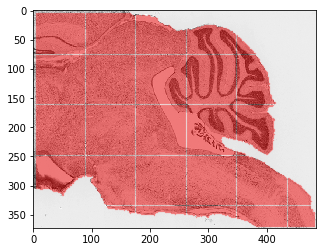

In [162]:
# Plots ALL Patch Locations
patch_fn_index = 70
image_fn_index = 70
x_pts = []
y_pts = []

print image_fn_list[image_fn_index]
print patch_fn_list[patch_fn_index]


with open(patch_loc_root+patch_fn_list[patch_fn_index], 'r') as patch_file:
    for i in range(50000):
        try:
            index, x, y = patch_file.readline().split(' ')
            x_pts.append( (float(x)/32) )
            y_pts.append( (float(y)/32) )
        except:
            continue
            
img = cv2.imread( images_root+image_fn_list[image_fn_index] , 2)
plt.imshow( img, cmap='gray')
plt.scatter(x_pts, y_pts, s=.1, c='red', alpha=0.5)

del x_pts
del y_pts

In [29]:
DataManager.get_cropbox_filename_v2(stack=stack, anchor_fn='FILENAME', prep_id=2)
metadata_cache['section_limits']
metadata_cache['sections_to_filenames']['MD589'][275]
section_to_filename[275]

'MD589-IHC53-2015.07.31-00.58.06_MD589_3_0159'

In [112]:
valid_sections = []
structure = 'DC'

for section in grid_index_class_lookup[structure].keys():
    # If this table entry is a numpy array, then it is filled with data. Otherwise (float) it is 'nan'
    if isinstance(grid_index_class_lookup[structure][section], np.ndarray):
        #if len(grid_index_class_lookup[structure][section])>0:
        valid_sections.append( section )

In [66]:
valid_structures = []
for structure in all_structures:
    if len(all_patch_locations[structure])>0:
        valid_structures.append(structure)
print valid_structures

['5N', '6N', '7N', '7n', 'Amb', 'LC', 'LRt', 'Pn', 'Tz', 'VLL', 'RMC', 'SNC', 'SNR', '3N', '4N', 'Sp5I', 'Sp5O', 'Sp5C', 'PBG', '10N', 'VCA', 'VCP', 'DC', 'AP', '12N', 'RtTg', 'SC', 'IC']


Number of Positive Patches: 163


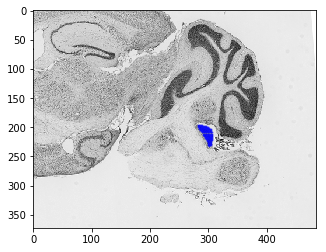

In [128]:

x_pts_str = []
y_pts_str = []
x_raw = []
y_raw = []
x_offset = -47
y_offset = -15
section = valid_sections[20]
valid_patch_indices = grid_index_class_lookup[structure][ section ]
print 'Number of Positive Patches:',len(valid_patch_indices)

for x, y in all_locs[valid_patch_indices]:
    x_raw.append( (float(x)) )
    y_raw.append( (float(y)) )
    x_pts_str.append( (float(x)/32)+x_offset )
    y_pts_str.append( (float(y)/32)+y_offset )
    
img = cv2.imread( images_root+section_to_filename[section]+'_prep2_thumbnail.tif' , 2)
plt.imshow( img, cmap='gray')

plt.scatter(x_pts_str, y_pts_str, s=1, c='blue', alpha=.5)

In [129]:
images_root

'/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain//CSHL_data_processed/MD589/MD589_prep2_thumbnail/'

In [135]:
ls /Users/kuiqian/BstemAtlasDataBackup/ucsd_brain//CSHL_data_processed/MD589/

MD589_alignedTo_MD589-IHC31-2015.07.30-23.26.22_MD589_1_0091_prep2_cropbox.json
MD589_alignedTo_MD589-IHC31-2015.07.30-23.26.22_MD589_1_0091_prep2_sectionLimits.json
MD589_anchor.txt
MD589_metadata_cache.json
MD589_prep2_lossless_gray/
MD589_prep2_sectionLimits.ini
MD589_prep2_thumbnail/
MD589_prep2_thumbnail_mask/
MD589_sorted_filenames.txt
MD589_transformsTo_MD589-IHC31-2015.07.30-23.26.22_MD589_1_0091.pkl
MD589_transformsTo_anchor.pkl
MD589_transforms_to_anchor.csv
operation_configs/


In [151]:
all_patch_locations['12N'][216]

[[12320, 8736],
 [12320, 8792],
 [12320, 8848],
 [12320, 8904],
 [12376, 8736],
 [12376, 8792],
 [12376, 8848],
 [12376, 8904],
 [12376, 8960],
 [12432, 8736],
 [12432, 8792],
 [12432, 8848],
 [12432, 8904],
 [12432, 8960],
 [12432, 9016],
 [12488, 8736],
 [12488, 8792],
 [12488, 8848],
 [12488, 8904],
 [12488, 8960],
 [12488, 9016],
 [12488, 9072],
 [12544, 8736],
 [12544, 8792],
 [12544, 8848],
 [12544, 8904],
 [12544, 8960],
 [12544, 9016],
 [12544, 9072],
 [12544, 9128],
 [12600, 8792],
 [12600, 8848],
 [12600, 8904],
 [12600, 8960],
 [12600, 9016],
 [12600, 9072],
 [12600, 9128],
 [12600, 9184],
 [12656, 8792],
 [12656, 8848],
 [12656, 8904],
 [12656, 8960],
 [12656, 9016],
 [12656, 9072],
 [12656, 9128],
 [12656, 9184],
 [12656, 9240],
 [12712, 8792],
 [12712, 8848],
 [12712, 8904],
 [12712, 8960],
 [12712, 9016],
 [12712, 9072],
 [12712, 9128],
 [12712, 9184],
 [12712, 9240],
 [12712, 9296],
 [12768, 8848],
 [12768, 8904],
 [12768, 8960],
 [12768, 9016],
 [12768, 9072],
 [12768,

Number of Positive Patches: 163


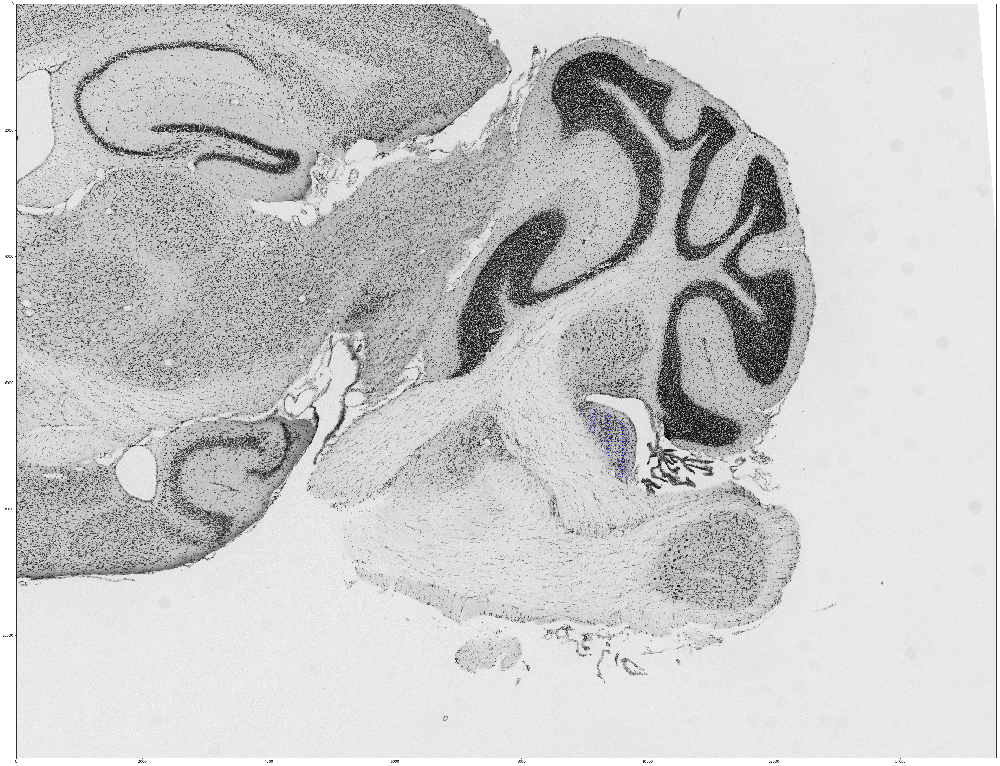

In [168]:
x_pts_str = []
y_pts_str = []
x_raw = []
y_raw = []
x_offset = -50*32
y_offset = -11*32
section = valid_sections[20]
valid_patch_indices = grid_index_class_lookup[structure][ section ]
print 'Number of Positive Patches:',len(valid_patch_indices)

for x, y in all_locs[valid_patch_indices]:
    x_raw.append( (float(x)) )
    y_raw.append( (float(y)) )
    x_pts_str.append( (float(x))+x_offset )
    y_pts_str.append( (float(y))+y_offset )
    
# img = cv2.imread( '/Users/kuiqian/BstemAtlasDataBackup/ucsd_brain//CSHL_data_processed/MD589/MD589_prep2_lossless_gray/'\
#                   +section_to_filename[section]+'_prep2_lossless_gray.tif', 2)
plt.figure( figsize=(50,50) )
plt.imshow( img, cmap='gray')

plt.scatter(x_pts_str, y_pts_str, s=3, c='blue', alpha=.9)



In [120]:
structure

'DC'

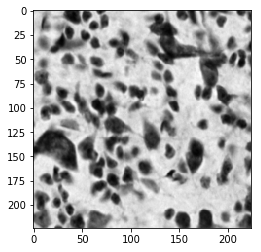

In [169]:

img = cv2.imread( raw_images_root+section_to_filename[section]+'_prep2_lossless_gray.tif', 2)
index = 50
x = int( float( all_patch_locations[structure][section][index][0] ) ) + x_offset
y = int( float( all_patch_locations[structure][section][index][1] ) ) + y_offset

patch = img[y:y+224,x:x+224]


plt.imshow( patch, cmap='gray')

In [103]:
raw_image_fn_list[50]

'MD589-IHC32-2015.07.30-23.30.34_MD589_1_0094_prep2_lossless_gray.tif'

In [23]:
import pandas

fn_hd = '/media/alexn/BstemAtlasDataBackup/ucsd_brain/CSHL_labelings_v3/MD594/MD594_annotation_structuresHanddrawn_05312018043152.hdf' # 6MB
fn_co = '/media/alexn/BstemAtlasDataBackup/ucsd_brain/CSHL_labelings_v3/MD594/MD594_annotation_contours_05312018035134.hdf' # 5.7MB
fn_st = '/media/alexn/BstemAtlasDataBackup/ucsd_brain/CSHL_labelings_v3/MD594/MD594_annotation_structures_11012017013215.hdf' #  1.3MB

In [34]:
i_hd = pandas.read_hdf(fn_hd)

print i_hd.keys()
print i_hd['name'][0]

Index([u'edits', u'name', u'origin', u'resolution', u'side', u'volume'], dtype='object')
RMC


In [31]:
for item in i_hd:
    print item

edits
name
origin
resolution
side
volume


In [25]:
i_hd

,edits,name,origin,resolution,side,volume
109066512106773,[],RMC,"[1300, 526, 583]",8.0um,R,blpk�� ��        \n       JSON     D...
113058115045632,[],LC,"[1507, 466, 648]",8.0um,R,blpk�� ��        \n       JSON     E...
116837006160528,[],LC,"[1509, 459, 448]",8.0um,L,blpk�� ��        \n       JSON     E...
130558812337002,[],Sp5O,"[1579, 503, 748]",8.0um,R,blpk   `l        (       JSON     F ...
144876136029104,[],LRt,"[1799, 630, 398]",8.0um,L,blpk   @?               JSON     E ...
144979757486365,[],5N,"[1510, 536, 368]",8.0um,L,blpk؝ ؝        \n       JSON     D  ...
146768542392515,[],VLL,"[1427, 495, 323]",8.0um,L,blpk    ;                JSON     F ...
147231063283877,[],DC,"[1563, 437, 758]",8.0um,R,blpk   �               JSON     F ...
156871905186678,[],SNR,"[1251, 525, 633]",8.0um,R,blpk   ��        (       JSON     G ...
159287725634090,[],VLL,"[1399, 507, 711]",8.0um,R,blpk   ��                JSON     F ...


In [21]:
pandas.read_hdf(fn_co)

,class,creator,edits,filename,id,label_position,name,orientation,parent_structure,resolution,section,side,side_manually_assigned,time_created,type,vertices
100098703842774,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-N31-2015.08.26-22.36.37_MD594_2_0092,100098703842774,"[29026.14318983844, 12262.52302640697]",7N,sagittal,[],raw,157,L,False,09132016003307,intersected,"[[29650.618637495485, 12017.406525430648], [29..."
100222193324575,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'053...",MD594-IHC27-2015.08.26-16.50.00_MD594_1_0079,100222193324575,"[23868.554418553962, 5908.877880192551]",IC,sagittal,[],raw,140,S,False,05312018035045,intersected,"[[22997.10366748096, 6896.609010237711], [2292..."
100323818129629,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-IHC34-2015.08.26-17.14.47_MD594_2_0101,100323818129629,"[30201.211880183255, 11554.889241930965]",Amb,sagittal,[],raw,170,L,False,09162016175039,intersected,"[[30325.84819144081, 11718.622178020792], [301..."
100561495701915,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-N57-2015.08.27-00.14.56_MD594_1_0169,100561495701915,"[31124.289997545042, 12635.376805598267]",IO,sagittal,[],raw,257,R,False,09172016022609,intersected,"[[30507.946864897494, 12926.959138017837], [30..."
100681336662670,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-N23-2015.08.26-22.09.28_MD594_2_0068,100681336662670,"[25458.98105205914, 10692.131173800512]",Pr5,sagittal,[],raw,125,L,False,09162016165044,intersected,"[[24988.389887213805, 11338.470630546855], [24..."
100706575066990,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-N23-2015.08.26-22.09.28_MD594_1_0067,100706575066990,"[27389.69041010622, 8661.036866092985]",DC,sagittal,[],raw,123,L,False,09162016171824,intersected,"[[28042.728424036337, 9083.239726132098], [279..."
101092747676272,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-N31-2015.08.26-22.36.37_MD594_2_0092,101092747676272,"[25292.68963357841, 12373.447428051975]",VLL,sagittal,[],raw,157,L,False,09132016003440,intersected,"[[24748.297787697324, 12407.543436720336], [24..."
101253522604102,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'053...",MD594-N32-2015.08.26-22.40.16_MD594_2_0095,101253522604102,"[22886.875849146225, 7202.228649601671]",SC,sagittal,[],raw,161,S,False,05312018033953,intersected,"[[22567.167652194737, 8619.322615187713], [224..."
101441043042110,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-N65-2015.08.27-00.47.47_MD594_2_0194,101441043042110,"[20063.180399689405, 13944.454622456342]",VLL,sagittal,[],raw,291,R,False,09172016023833,intersected,"[[20507.67463556901, 14990.85544327056], [2036..."
101471955801140,contour,yuncong,"[{u'username': u'yuncong', u'timestamp': u'091...",MD594-N44-2015.08.26-23.26.52_MD594_2_0131,101471955801140,"[24918.430667142504, 12693.141079564874]",RtTg,sagittal,[],raw,209,S,False,09162016182003,intersected,"[[25266.03989794646, 13430.038124466919], [251..."
